# Import Libraries

In [1]:
import requests 
from bs4 import BeautifulSoup as soup
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats.mstats import winsorize

In [2]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

# Step 1 : Loading the Dataset

In [3]:
bean_ds=pd.read_csv('Dry_Bean_Dataset.csv')
bean_ds.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610291.00,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638018.00,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.11,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645884.00,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620134.00,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
bean_ds.shape

(13611, 17)

# Step 2 : Data Profilling and Cleaning

In [5]:
bean_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [6]:
bean_ds.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,1.361100e+04,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,7.729110e+05,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,3.238848e+05,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,5.536000e+02,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,6.769955e+05,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,7.722730e+05,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,9.555000e+05,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1.921685e+06,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


# Handling Null values

# Data Cleaning

In [7]:
bean_ds.isnull().values.any()

False

In [9]:
print("\nColumns with missing value\n") 
print(bean_ds.isnull().any())


Columns with missing value

Area               False
Perimeter          False
MajorAxisLength    False
MinorAxisLength    False
AspectRation       False
Eccentricity       False
ConvexArea         False
EquivDiameter      False
Extent             False
Solidity           False
roundness          False
Compactness        False
ShapeFactor1       False
ShapeFactor2       False
ShapeFactor3       False
ShapeFactor4       False
Class              False
dtype: bool


In [11]:
bean_ds.isnull().sum().sum()

# There are no NULL values in the dataset, hence it is clean.

0

In [12]:
bean_ds.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

# Step 3 : EDA and Visualization

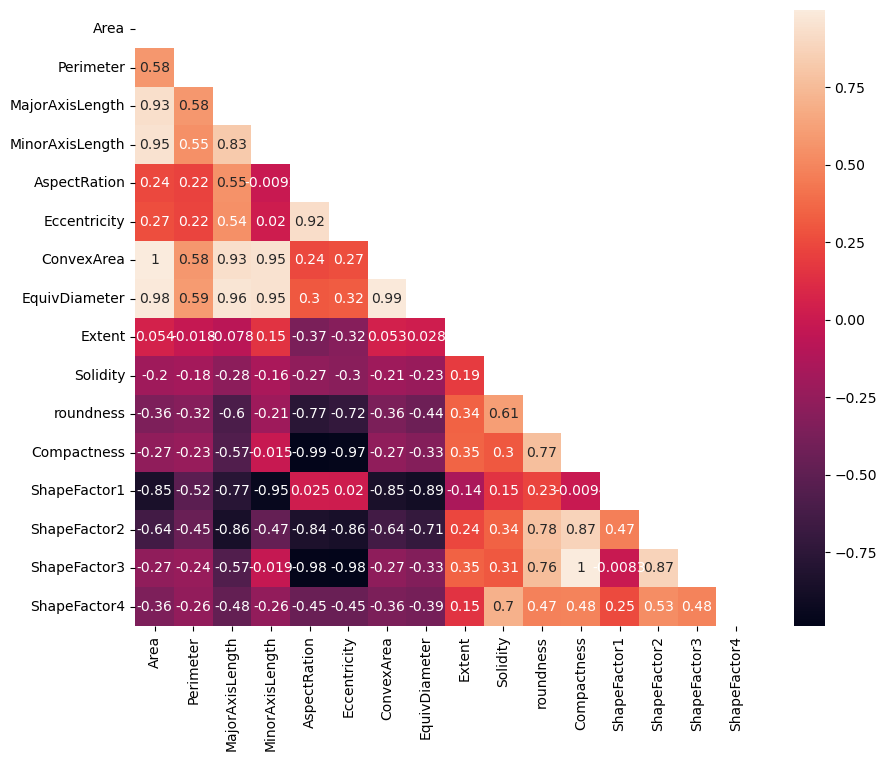

In [13]:
# num is all data except the bean class (target)

num = bean_ds
correlations_matrix = num.corr()
mask = np.zeros_like(correlations_matrix) 
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(correlations_matrix, mask=mask, annot=True)
plt.show()

In [ ]:
bean.hist( figsize=(22, 17))
plt.show()

In [8]:
bean_ds.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,1.000000,0.577670,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721
Perimeter,0.577670,1.000000,0.580417,0.546899,0.222459,0.224536,0.578263,0.590821,-0.018143,-0.179480,-0.318802,-0.234670,-0.515837,-0.450446,-0.235401,-0.258582
MajorAxisLength,0.931834,0.580417,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527
MinorAxisLength,0.951602,0.546899,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749
AspectRation,0.241735,0.222459,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264
Eccentricity,0.267481,0.224536,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354
ConvexArea,0.999939,0.578263,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049
EquivDiameter,0.984968,0.590821,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512
Extent,0.054345,-0.018143,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502
Solidity,-0.196585,-0.179480,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163


<AxesSubplot:>

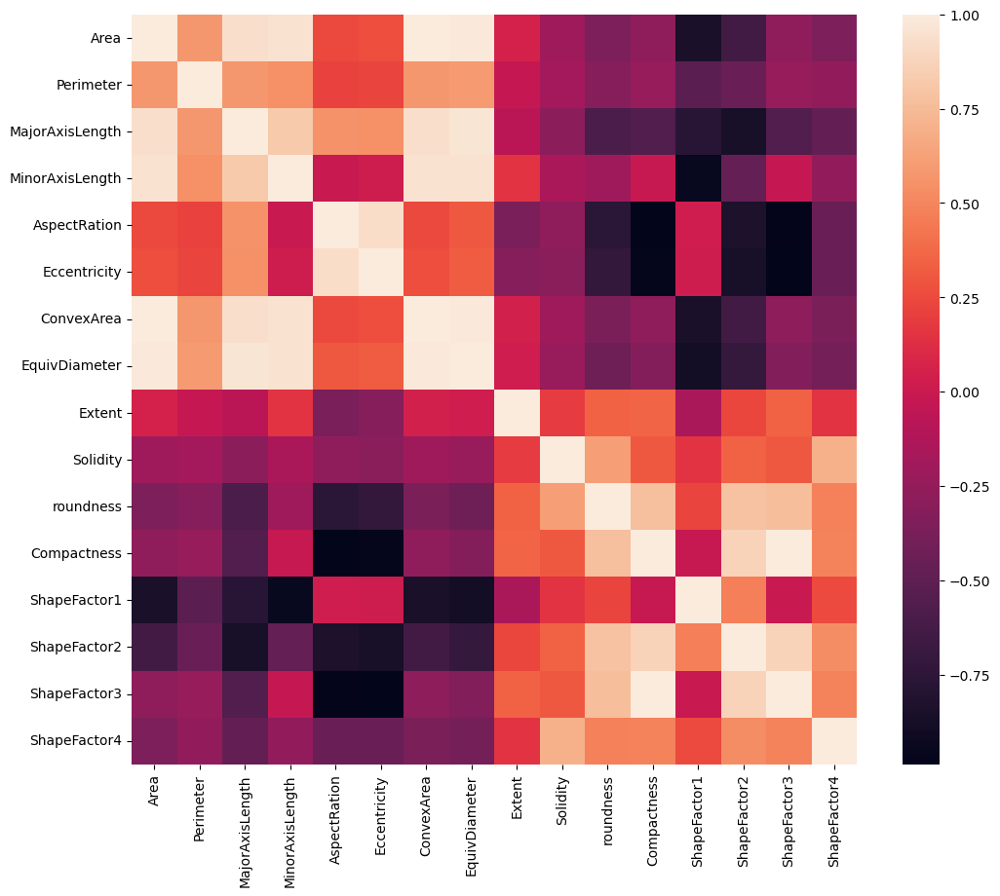

In [9]:
fig=plt.figure(figsize=(12,10))
sns.heatmap(bean_ds.corr())

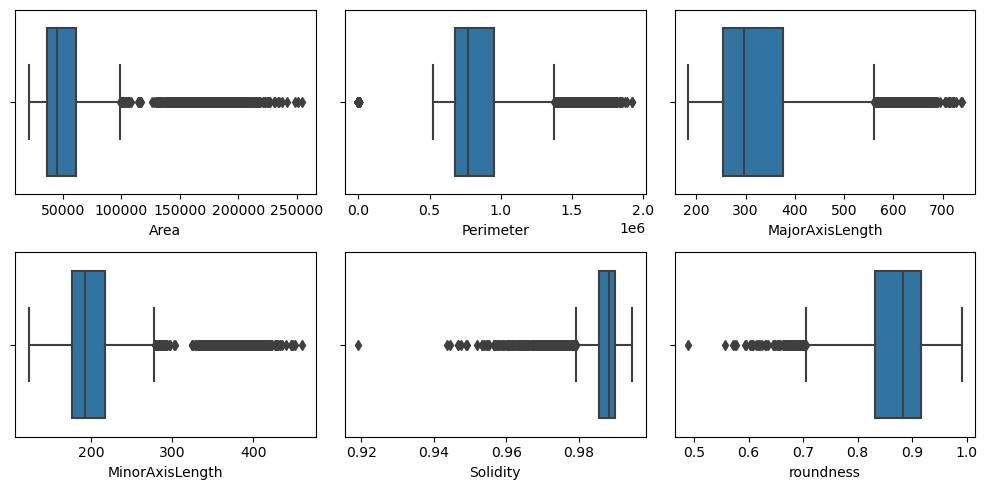

In [10]:
# Outlier Analysis
fig, axs = plt.subplots(2,3, figsize = (10,5))
plt1 = sns.boxplot(bean_ds['Area'], ax = axs[0,0])
plt2 = sns.boxplot(bean_ds['Perimeter'], ax = axs[0,1])
plt3 = sns.boxplot(bean_ds['MajorAxisLength'], ax = axs[0,2])
plt1 = sns.boxplot(bean_ds['MinorAxisLength'], ax = axs[1,0])
plt2 = sns.boxplot(bean_ds['Solidity'], ax = axs[1,1])
plt3 = sns.boxplot(bean_ds['roundness'], ax = axs[1,2])
plt.tight_layout()

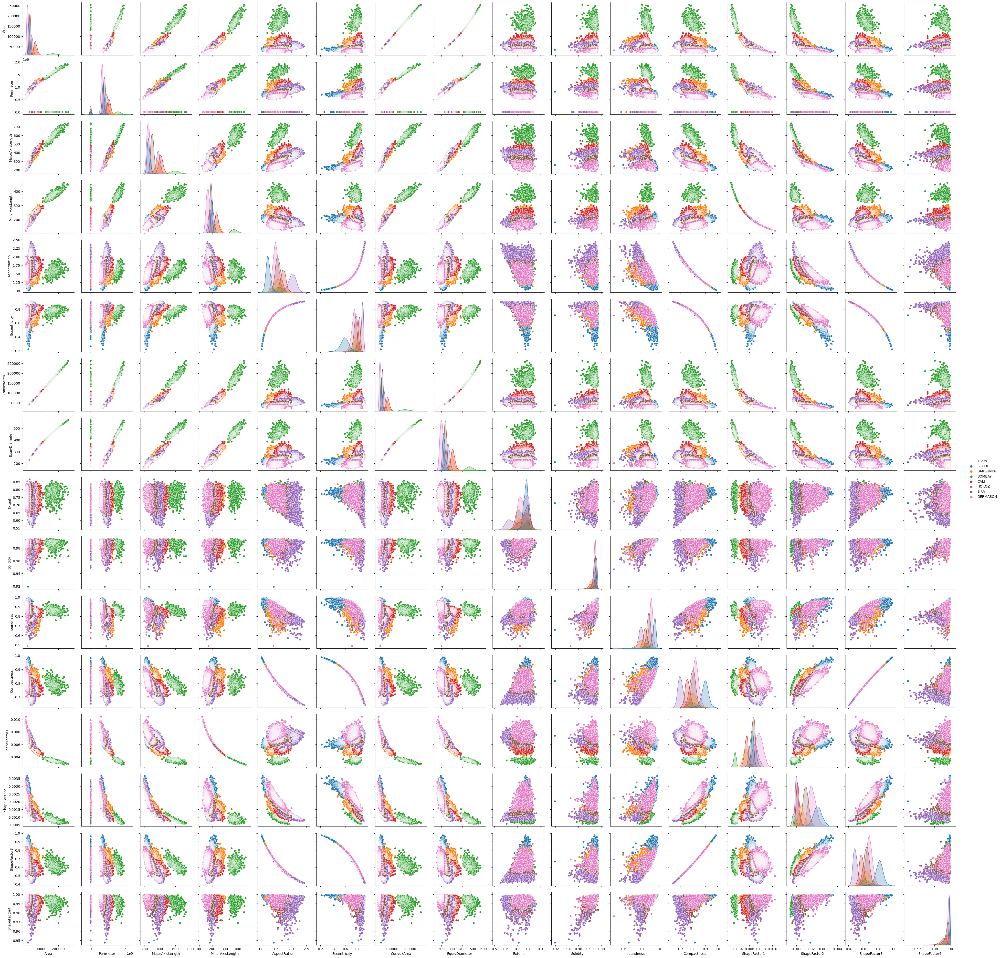

In [11]:
sns.pairplot(bean_ds, hue='Class')

<AxesSubplot:xlabel='Class', ylabel='Area'>

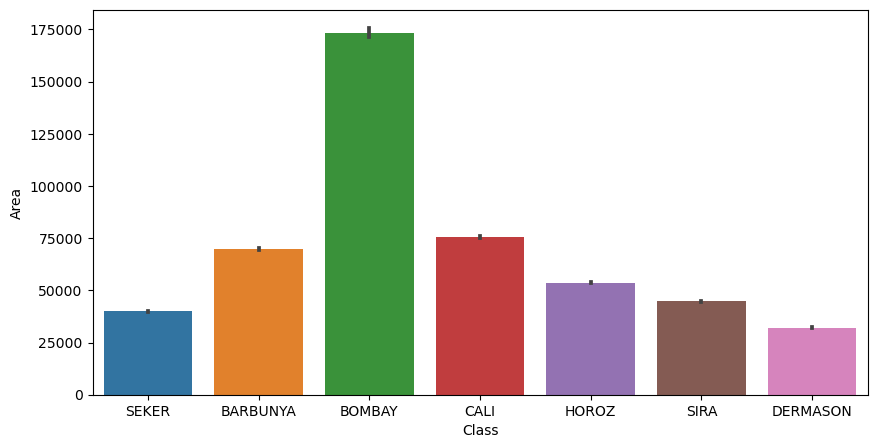

In [12]:
plt.figure(figsize=(10,5)) 
sns.barplot(x='Class',y='Area',data=bean_ds)

<Figure size 2500x2000 with 0 Axes>

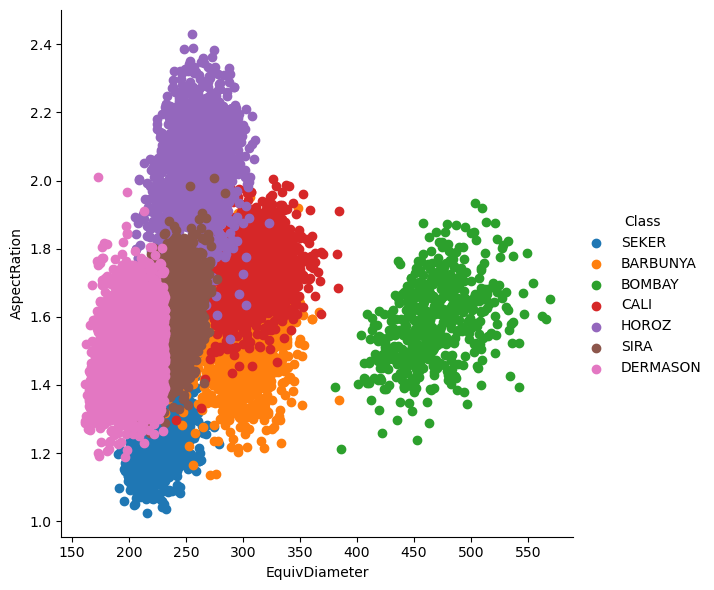

In [13]:
plt.figure(figsize=(25,20))
sns.FacetGrid(bean_ds, hue ="Class",height = 6).map(plt.scatter,'EquivDiameter','AspectRation').add_legend()

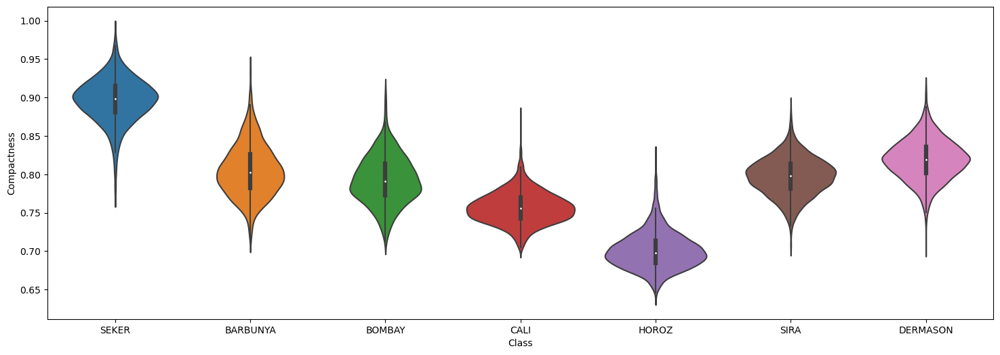

In [14]:
plt.figure(figsize=(18,6))
sns.violinplot(x="Class", y="Compactness", data=bean_ds)
plt.show()

In [15]:
COLUMNS = bean_ds.columns.tolist()
feature_cols = COLUMNS[:-1]
COLUMNS

['Area',
 'Perimeter',
 'MajorAxisLength',
 'MinorAxisLength',
 'AspectRation',
 'Eccentricity',
 'ConvexArea',
 'EquivDiameter',
 'Extent',
 'Solidity',
 'roundness',
 'Compactness',
 'ShapeFactor1',
 'ShapeFactor2',
 'ShapeFactor3',
 'ShapeFactor4',
 'Class']

# Apply transformation to skewed columns and scaling all the data

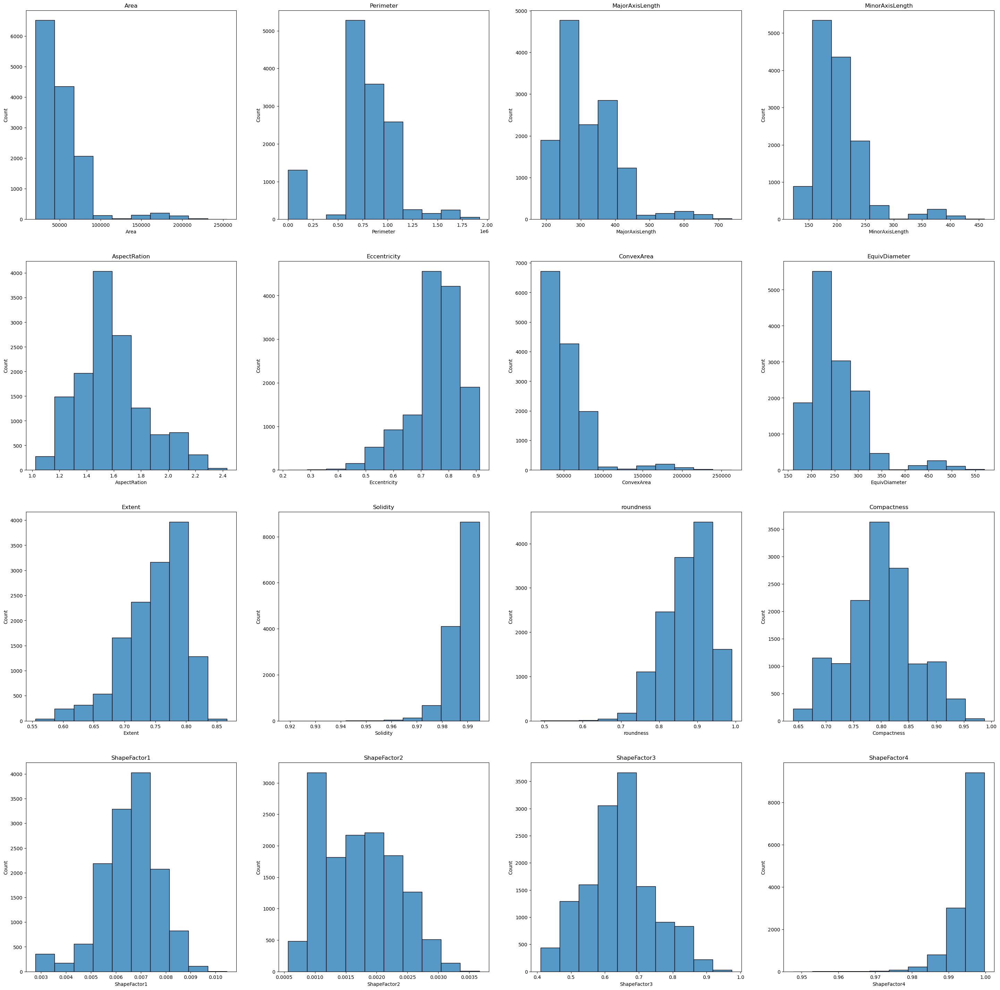

In [16]:
fig, ax_list = plt.subplots(nrows=4, ncols=4, sharey=False, figsize=(36,36))
ax_list = ax_list.flatten()
for name, ax in zip(feature_cols, ax_list):
     g = sns.histplot(bean_ds,x=name, bins=10, ax=ax).set(title=name)

# Feature importance

In [17]:
x = bean_ds.drop(['Class'], axis=1)
y = bean_ds.Class

In [18]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(x,y)
print(model.feature_importances_)

[0.07517853 0.03086472 0.0725476  0.07395229 0.07720252 0.07198632
 0.06591734 0.09582363 0.01455205 0.01856413 0.0670983  0.07689512
 0.08036748 0.07467471 0.07549164 0.02888361]


<AxesSubplot:>

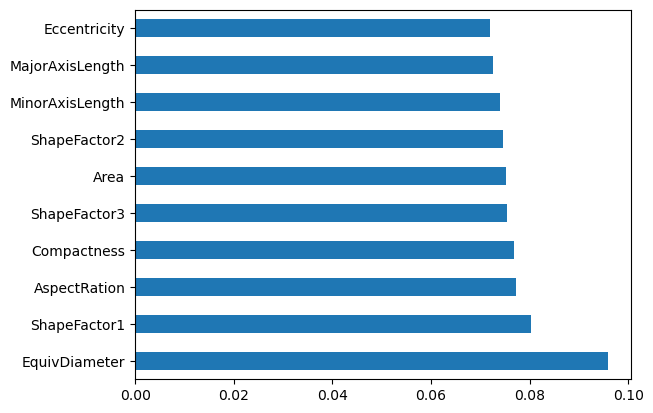

In [19]:
feat_imp = pd.Series(model.feature_importances_, index=x.columns)
feat_imp.nlargest(10).plot(kind='barh')

In [20]:
x.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4'],
      dtype='object')

In [21]:
from sklearn.model_selection import train_test_split

In [22]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)



# Model and csv

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [24]:
from sklearn.neural_network import MLPClassifier

# Create an instance of the classifier
classifier = MLPClassifier(random_state=0,max_iter=1000,alpha=0.115)


# Train the classifier
classifier = classifier.fit(x, y)

In [25]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(
  classifier, x, y, cv=7, scoring='f1_micro')
scores.mean()

0.40942935427368443

In [26]:
print("The accuracy of the classifier on the training set is ", (classifier.score(x, y)))

The accuracy of the classifier on the training set is  0.5261920505473514


In [27]:
y_train_pred = classifier.predict(x)
from sklearn.metrics import f1_score
f1_score(
        y, 
        y_train_pred, 
        average='micro'
    )

0.5261920505473514

In [28]:
y_test_predicted = classifier.predict(x_test)


In [29]:
from sklearn.svm import SVC
from sklearn.multiclass import OneVsOneClassifier,OneVsRestClassifier
model = SVC(C=1,
        gamma=0.4,
             )

svm_model = OneVsOneClassifier(model)


svm_model.fit(x, y)

OneVsOneClassifier(estimator=SVC(C=1, gamma=0.4))

In [29]:
y_pred = classifier.predict(x_test)

cls_rpt = classification_report(y_test, y_pred)

print(cls_rpt)

              precision    recall  f1-score   support

    BARBUNYA       0.37      0.71      0.49       389
      BOMBAY       1.00      0.88      0.94       134
        CALI       0.64      0.13      0.21       501
    DERMASON       0.67      0.94      0.78      1057
       HOROZ       0.44      0.66      0.52       594
       SEKER       0.38      0.50      0.43       579
        SIRA       0.00      0.00      0.00       830

    accuracy                           0.52      4084
   macro avg       0.50      0.54      0.48      4084
weighted avg       0.44      0.52      0.44      4084



In [30]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(
  svm_model, x, y, cv=5, scoring='f1_micro')
scores.mean()

0.2605245597480629

In [31]:
y_train_pred = svm_model.predict(x)
from sklearn.metrics import f1_score
f1_score(
        y, 
        y_train_pred, 
        average='micro'
    )

1.0

In [32]:
from sklearn.metrics import classification_report
print('Results on the test set:')
print(classification_report(y, y_train_pred))

Results on the test set:
              precision    recall  f1-score   support

    BARBUNYA       1.00      1.00      1.00      1322
      BOMBAY       1.00      1.00      1.00       522
        CALI       1.00      1.00      1.00      1630
    DERMASON       1.00      1.00      1.00      3546
       HOROZ       1.00      1.00      1.00      1928
       SEKER       1.00      1.00      1.00      2027
        SIRA       1.00      1.00      1.00      2636

    accuracy                           1.00     13611
   macro avg       1.00      1.00      1.00     13611
weighted avg       1.00      1.00      1.00     13611

